## Feature selection and enigneering

### 1) Data cleaning and pre-processing

In [1]:
# import packages
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import math
import gc

In [2]:
# load data (train.csv will be the complete dataset for predictive modeling, ignore Test.csv for now)
data=pd.read_csv("./data/Train.csv")

#### Convert the sensor data for each feature from string type into a list of values

In [3]:
# define a function to replace spaces in the string (i.e. missings) with NaN
def replace_nan(x):
    if x==" ":
        return np.nan
    else :
        return float(x)

# define list of feature names
features=["temp","precip","rel_humidity","wind_dir","wind_spd","atmos_press"]


for feature in features : 
    # first replace every 'nan' in a cell with an empty space, split using comma, and then apply replace_nan function on every item
    data[feature]=data[feature].apply(lambda x: [ replace_nan(X) for X in x.replace("nan"," ").split(",")])    

### Features engineering

#### Extract north-south and east-west directions from wind direction

In [4]:
data["wind_dir_x"] = data.wind_dir.apply(lambda x: list(np.cos(np.array(x) * np.pi /180)))
data["wind_dir_y"] = data.wind_dir.apply(lambda x: list(np.sin(np.array(x) * np.pi /180)))
data.drop("wind_dir", axis=1, inplace=True)

#### re-arrange columns

In [6]:
data = data.reindex(columns=['ID', 'location', 'temp', 'precip','rel_humidity','wind_dir_x','wind_dir_y','wind_spd','atmos_press', 'target'])

In [7]:
data.head()

,ID,location,temp,precip,rel_humidity,wind_dir_x,wind_dir_y,wind_spd,atmos_press,target
0,ID_train_0,C,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",45.126304
1,ID_train_1,D,"[22.53333333, 21.71666667, 20.83333333, 20.983...","[0.102, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.034, 0...","[0.744583333, 0.808083333, 0.911166667, 0.9163...","[0.20217729203070506, 0.014724939532783088, 0....","[-0.9793489381150781, 0.9998915822006683, 0.99...","[2.3775, 1.126666667, 0.700833333, 0.341666667...","[90.32, 90.3775, 90.44083333, 90.4725, 90.4541...",79.131702
2,ID_train_10,A,"[28.975, 27.95, 29.6, 26.425, 22.09166667, 21....","[0.0, 0.0, 0.0, 0.102, 0.136, 0.0, 0.0, 2.16, ...","[0.573333333, 0.597166667, 0.5668333329999999,...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[88.55166667, 88.46416667, 88.31916667, 88.24,...",32.661304
3,ID_train_100,A,"[22.96666667, 24.26666667, 25.275, 25.625, 25....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.77,...","[0.8430833329999999, 0.79025, 0.7375, 0.728, 0...","[0.5012850907196592, 0.40157952639943006, 0.41...","[-0.8652821839274071, -0.9158241555980108, -0....","[1.446666667, 1.1925, 1.324166667, 1.544166666...","[88.615, 88.53083333, 88.4, 88.27166667, 88.20...",53.850238
4,ID_train_1000,A,"[21.875, 21.575, 21.525, 21.43333333, 20.50833...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.8564166670000001, 0.874916667, 0.879833333,...","[0.9282265037146243, 0.9560285040546017, 0.012...","[0.3720155343553874, 0.2932737619275212, 0.999...","[0.1975, 0.244166667, 0.411666667, 0.56, 0.577...","[88.55666667, 88.64083333, 88.65833333, 88.647...",177.418750


#### calculate percent NaN for each recording period per feature

In [8]:
# recording periods contain varying degrees of NaNs: compute percent NaN for each recording period and feature
# function to compute the percentage of NaNs per recording period
def compute_percent_nan(df, col_name):
    df['percent_nan_'+col_name] = df[col_name].apply(lambda x: np.isnan(np.array(x)).sum()/len(x)*100)
    return df

In [10]:
# define new feature list
new_features = ['temp', 'precip','rel_humidity','wind_dir_x','wind_dir_y','wind_spd','atmos_press']

In [11]:
# calculate percentage of missings per recording period and feature and append to dataframe
for col_name in tqdm(new_features):
    data=compute_percent_nan(data,col_name)

100%|██████████| 7/7 [00:00<00:00,  9.22it/s]


In [12]:
# get last value for each time series
# did this before dropping all NaNs
def last(x):
    if not pd.isna(x[-1]):
        return x[-1]
    if pd.isna(x[-1]) and not pd.isna(x[-2]):
        return x[-2]
    return x[-25]
    #e=1
    #while pd.isna(x[-e]) and e < len(x):
    #    e += 24
    #return x[-e]
    
def get_last(x,col_name):
    x["last_"+col_name]=x[col_name].apply(last)
    return x 

In [13]:
# extract the last measurement points
for col_name in new_features:
    data=get_last(data,col_name)

#### Remove NaNs from lists of raw data and extract summary statistics

In [14]:
# aggregation function extracting summary statistics from every recording period and appending it as a new column to a dataframe
def aggregate_features(x,col_name):
    x["max_"+col_name]=x[col_name].apply(np.max)
    x["min_"+col_name]=x[col_name].apply(np.min)
    x["mean_"+col_name]=x[col_name].apply(np.mean)
    x["std_"+col_name]=x[col_name].apply(np.std)
    x["var_"+col_name]=x[col_name].apply(np.var)
    x["median_"+col_name]=x[col_name].apply(np.median)
    x["ptp_"+col_name]=x[col_name].apply(np.ptp)
    return x  

# function returning only non-Null values (helper for aggregation function)
def remove_nan_values(x):
    return [e for e in x if not math.isnan(e)]


In [15]:
# remove NaNs from dataframe
for col_name in tqdm(new_features):
   data[col_name]=data[col_name].apply(remove_nan_values)

100%|██████████| 7/7 [00:00<00:00,  8.48it/s]


In [16]:
#extract summary statistics for each recording period and feature
for col_name in tqdm(new_features):
    data=aggregate_features(data,col_name)

100%|██████████| 7/7 [00:06<00:00,  1.00it/s]


#### drop raw data contained in lists

In [17]:
# drop raw sensor data contained as list from the initial dataset
data.drop(new_features,1,inplace=True)

/var/folders/dn/n_6mm8pj72738s4ygylk0sgm0000gn/T/ipykernel_6666/3089539625.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  data.drop(new_features,1,inplace=True)


In [18]:
data.head()

,ID,location,target,percent_nan_temp,percent_nan_precip,percent_nan_rel_humidity,percent_nan_wind_dir_x,percent_nan_wind_dir_y,percent_nan_wind_spd,percent_nan_atmos_press,...,var_wind_spd,median_wind_spd,ptp_wind_spd,max_atmos_press,min_atmos_press,mean_atmos_press,std_atmos_press,var_atmos_press,median_atmos_press,ptp_atmos_press
0,ID_train_0,C,45.126304,86.776860,86.776860,86.776860,86.776860,86.776860,86.776860,86.776860,...,0.155268,0.666250,1.355000,87.871667,87.614167,87.752434,0.070374,0.004952,87.762083,0.257500
1,ID_train_1,D,79.131702,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.290736,0.744167,2.760833,90.725000,90.056667,90.429924,0.156000,0.024336,90.429167,0.668333
2,ID_train_10,A,32.661304,0.826446,0.826446,0.826446,38.016529,38.016529,38.016529,0.826446,...,0.342484,0.942500,2.420000,88.813333,87.982500,88.420931,0.179481,0.032213,88.425000,0.830833
3,ID_train_100,A,53.850238,0.000000,0.000000,0.000000,42.148760,42.148760,42.148760,0.000000,...,0.336701,1.388333,2.469167,88.685000,87.965000,88.376915,0.161758,0.026166,88.400000,0.720000
4,ID_train_1000,A,177.418750,75.206612,75.206612,75.206612,75.206612,75.206612,75.206612,75.206612,...,0.181690,0.542917,1.796667,88.719167,88.268333,88.538104,0.118369,0.014011,88.552500,0.450833


In [19]:
data.columns

Index(['ID', 'location', 'target', 'percent_nan_temp', 'percent_nan_precip',
       'percent_nan_rel_humidity', 'percent_nan_wind_dir_x',
       'percent_nan_wind_dir_y', 'percent_nan_wind_spd',
       'percent_nan_atmos_press', 'last_temp', 'last_precip',
       'last_rel_humidity', 'last_wind_dir_x', 'last_wind_dir_y',
       'last_wind_spd', 'last_atmos_press', 'max_temp', 'min_temp',
       'mean_temp', 'std_temp', 'var_temp', 'median_temp', 'ptp_temp',
       'max_precip', 'min_precip', 'mean_precip', 'std_precip', 'var_precip',
       'median_precip', 'ptp_precip', 'max_rel_humidity', 'min_rel_humidity',
       'mean_rel_humidity', 'std_rel_humidity', 'var_rel_humidity',
       'median_rel_humidity', 'ptp_rel_humidity', 'max_wind_dir_x',
       'min_wind_dir_x', 'mean_wind_dir_x', 'std_wind_dir_x', 'var_wind_dir_x',
       'median_wind_dir_x', 'ptp_wind_dir_x', 'max_wind_dir_y',
       'min_wind_dir_y', 'mean_wind_dir_y', 'std_wind_dir_y', 'var_wind_dir_y',
       'median_wind_di

In [20]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15539 entries, 0 to 15538
Data columns (total 66 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   ID                        15539 non-null  object 
 1   location                  15539 non-null  object 
 2   target                    15539 non-null  float64
 3   percent_nan_temp          15539 non-null  float64
 4   percent_nan_precip        15539 non-null  float64
 5   percent_nan_rel_humidity  15539 non-null  float64
 6   percent_nan_wind_dir_x    15539 non-null  float64
 7   percent_nan_wind_dir_y    15539 non-null  float64
 8   percent_nan_wind_spd      15539 non-null  float64
 9   percent_nan_atmos_press   15539 non-null  float64
 10  last_temp                 15066 non-null  float64
 11  last_precip               15071 non-null  float64
 12  last_rel_humidity         15070 non-null  float64
 13  last_wind_dir_x           14839 non-null  float64
 14  last_w

In [21]:
data.set_index('ID', drop=True, inplace=True)
data.head()

,location,target,percent_nan_temp,percent_nan_precip,percent_nan_rel_humidity,percent_nan_wind_dir_x,percent_nan_wind_dir_y,percent_nan_wind_spd,percent_nan_atmos_press,last_temp,...,var_wind_spd,median_wind_spd,ptp_wind_spd,max_atmos_press,min_atmos_press,mean_atmos_press,std_atmos_press,var_atmos_press,median_atmos_press,ptp_atmos_press
ID,,,,,,,,,,,,,,,,,,,,,
ID_train_0,C,45.126304,86.776860,86.776860,86.776860,86.776860,86.776860,86.776860,86.776860,19.583333,...,0.155268,0.666250,1.355000,87.871667,87.614167,87.752434,0.070374,0.004952,87.762083,0.257500
ID_train_1,D,79.131702,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,21.450000,...,0.290736,0.744167,2.760833,90.725000,90.056667,90.429924,0.156000,0.024336,90.429167,0.668333
ID_train_10,A,32.661304,0.826446,0.826446,0.826446,38.016529,38.016529,38.016529,0.826446,30.091667,...,0.342484,0.942500,2.420000,88.813333,87.982500,88.420931,0.179481,0.032213,88.425000,0.830833
ID_train_100,A,53.850238,0.000000,0.000000,0.000000,42.148760,42.148760,42.148760,0.000000,24.641667,...,0.336701,1.388333,2.469167,88.685000,87.965000,88.376915,0.161758,0.026166,88.400000,0.720000
ID_train_1000,A,177.418750,75.206612,75.206612,75.206612,75.206612,75.206612,75.206612,75.206612,NaN,...,0.181690,0.542917,1.796667,88.719167,88.268333,88.538104,0.118369,0.014011,88.552500,0.450833


### Filter dataframe for observations with percent NaN < 30% for all features

In [24]:
# get NaN columns
nan_columns = ['percent_nan_temp', 'percent_nan_precip',
       'percent_nan_rel_humidity', 'percent_nan_wind_dir_x',
       'percent_nan_wind_dir_y','percent_nan_wind_spd', 'percent_nan_atmos_press']

In [25]:
# filter observations based on percent NaN and check again the data distribution of the target and summary features
df_filtered = data[(data[nan_columns]<30).all(axis=1)]
df_filtered.head()

,location,target,percent_nan_temp,percent_nan_precip,percent_nan_rel_humidity,percent_nan_wind_dir_x,percent_nan_wind_dir_y,percent_nan_wind_spd,percent_nan_atmos_press,last_temp,...,var_wind_spd,median_wind_spd,ptp_wind_spd,max_atmos_press,min_atmos_press,mean_atmos_press,std_atmos_press,var_atmos_press,median_atmos_press,ptp_atmos_press
ID,,,,,,,,,,,,,,,,,,,,,
ID_train_1,D,79.131702,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,21.450000,...,0.290736,0.744167,2.760833,90.725000,90.056667,90.429924,0.156000,0.024336,90.429167,0.668333
ID_train_10000,E,17.005000,0.0,0.0,0.000000,14.049587,14.049587,14.049587,0.0,25.075000,...,0.282313,1.075000,3.122500,88.746667,88.097500,88.437645,0.147604,0.021787,88.420833,0.649167
ID_train_10001,C,53.100000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,19.508333,...,0.198869,0.893333,1.884167,87.961667,87.472500,87.717645,0.121492,0.014760,87.729167,0.489167
ID_train_10002,A,55.051143,0.0,0.0,0.000000,3.305785,3.305785,3.305785,0.0,18.975000,...,0.226285,0.716667,1.919167,88.511667,87.838333,88.212652,0.169373,0.028687,88.235000,0.673333
ID_train_10005,D,55.638261,0.0,0.0,0.826446,1.652893,1.652893,1.652893,0.0,20.491667,...,0.533776,0.840833,3.285000,90.986667,90.211667,90.624814,0.179998,0.032399,90.641667,0.775000


In [26]:
percent_reduc = (data.shape[0]-df_filtered.shape[0]) / data.shape[0]*100
print(f'Percent reduction in dataset size after filtering: {round(percent_reduc,1)}%')

Percent reduction in dataset size after filtering: 13.0%


In [27]:
df_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13522 entries, ID_train_1 to ID_train_9999
Data columns (total 65 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   location                  13522 non-null  object 
 1   target                    13522 non-null  float64
 2   percent_nan_temp          13522 non-null  float64
 3   percent_nan_precip        13522 non-null  float64
 4   percent_nan_rel_humidity  13522 non-null  float64
 5   percent_nan_wind_dir_x    13522 non-null  float64
 6   percent_nan_wind_dir_y    13522 non-null  float64
 7   percent_nan_wind_spd      13522 non-null  float64
 8   percent_nan_atmos_press   13522 non-null  float64
 9   last_temp                 13492 non-null  float64
 10  last_precip               13497 non-null  float64
 11  last_rel_humidity         13497 non-null  float64
 12  last_wind_dir_x           13457 non-null  float64
 13  last_wind_dir_y           13457 non-null  float64

Even with the filtered dataframe, there are many missings with respect to the last 5 measurement points. One may first define an imputation strategy before using these features for prediction. Otherwise, we would lose many observations.

#### Additionally filter for observation periods with NaN as last measurement point

In [28]:
df_filtered.dropna(how='any', inplace=True)
df_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13452 entries, ID_train_1 to ID_train_9999
Data columns (total 65 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   location                  13452 non-null  object 
 1   target                    13452 non-null  float64
 2   percent_nan_temp          13452 non-null  float64
 3   percent_nan_precip        13452 non-null  float64
 4   percent_nan_rel_humidity  13452 non-null  float64
 5   percent_nan_wind_dir_x    13452 non-null  float64
 6   percent_nan_wind_dir_y    13452 non-null  float64
 7   percent_nan_wind_spd      13452 non-null  float64
 8   percent_nan_atmos_press   13452 non-null  float64
 9   last_temp                 13452 non-null  float64
 10  last_precip               13452 non-null  float64
 11  last_rel_humidity         13452 non-null  float64
 12  last_wind_dir_x           13452 non-null  float64
 13  last_wind_dir_y           13452 non-null  float64

/Users/aengelhardt/neuefische/ds-air-quality/.venv/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


#### Examine location-wise correlations between summary features and target

In [29]:
def plot_scatter(data, features, title):
    # define a list of locations
    locations = ['A', 'B', 'C', 'D', 'E']
    # define a list of associated colors
    colors = ['blue', 'red', 'green', 'purple', 'orange']

    # generate dataframe with relevant variables
    new_df = pd.concat([df_filtered[['location', 'target']], df_filtered[features]], axis=1)

    fig = plt.figure(figsize=(15, 20))
    plt.suptitle(f'{title}\n', fontsize=18)

    k=1 # set index for subplot

    for row in range(1, len(features)+1):
        for col in range(1, 6):
            ax = fig.add_subplot(len(features), 5, k)
            subplot = sns.scatterplot(data=new_df[new_df.location == locations[col-1]], x=new_df.iloc[:,row+1], 
                                    y='target', color=colors[col-1])
            ax.set_title('Location ' + locations[col-1])
            k += 1

    fig.tight_layout()

In [31]:
df_filtered.columns[9:16]

Index(['last_temp', 'last_precip', 'last_rel_humidity', 'last_wind_dir_x',
       'last_wind_dir_y', 'last_wind_spd', 'last_atmos_press'],
      dtype='object')

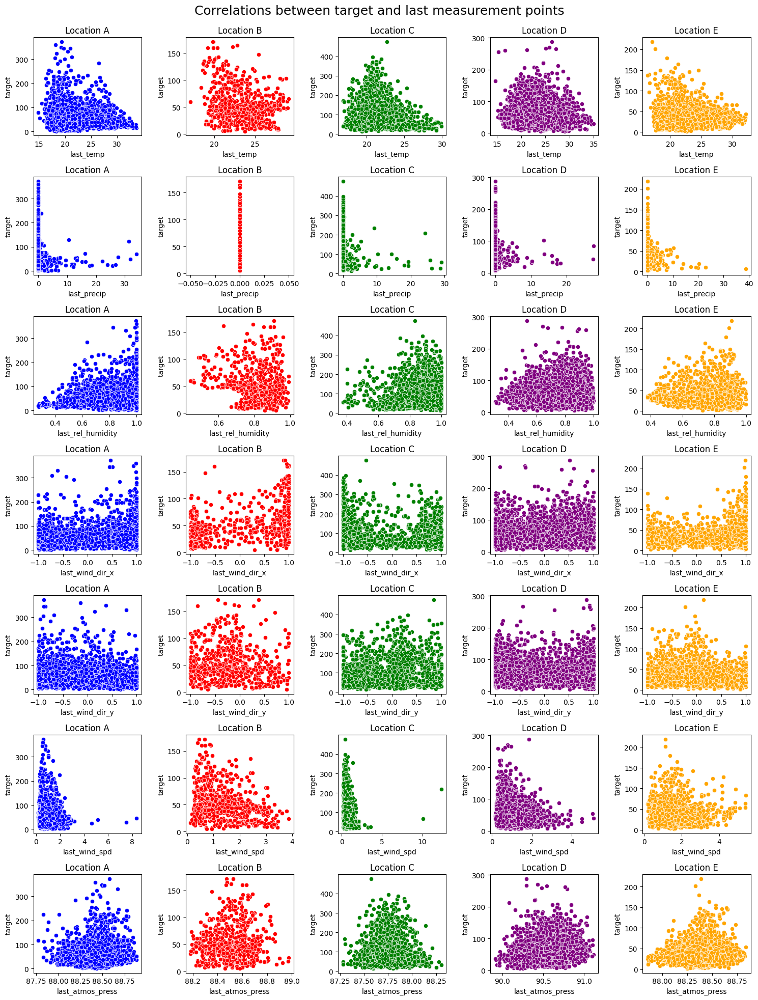

In [33]:
plot_scatter(df_filtered, df_filtered.columns[9:16].tolist(), 'Correlations between target and last measurement points')

In [34]:
df_filtered.columns[16:23]

Index(['max_temp', 'min_temp', 'mean_temp', 'std_temp', 'var_temp',
       'median_temp', 'ptp_temp'],
      dtype='object')

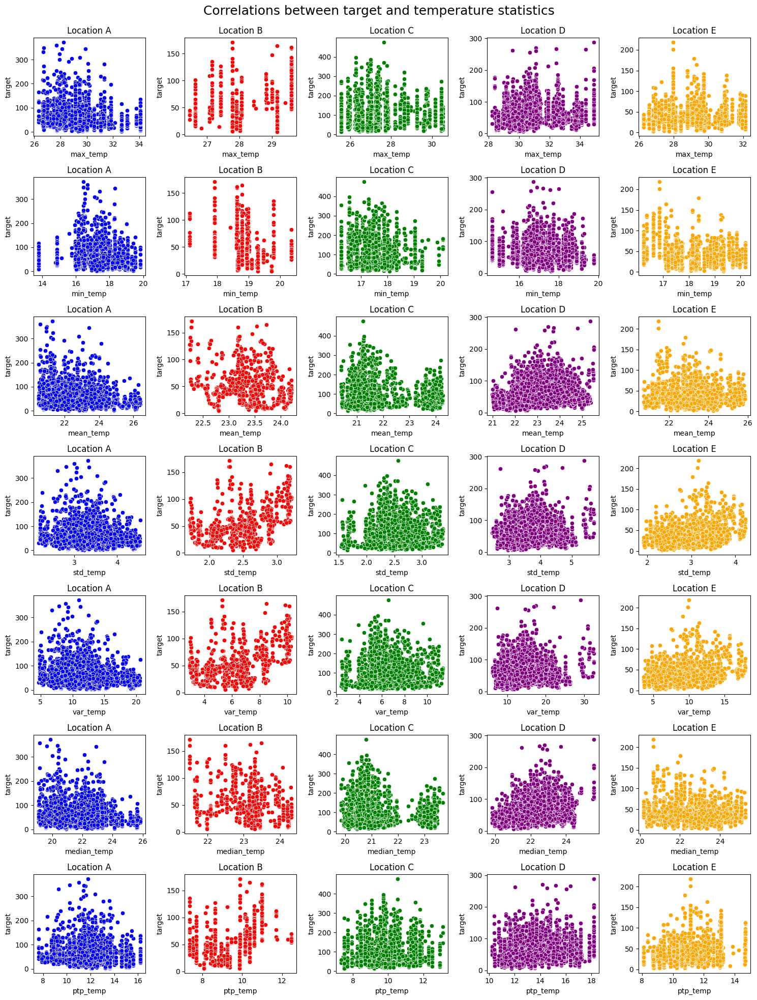

In [35]:
plot_scatter(df_filtered, df_filtered.columns[16:23].tolist(), 'Correlations between target and temperature statistics')

In [36]:
df_filtered.columns[23:30]

Index(['max_precip', 'min_precip', 'mean_precip', 'std_precip', 'var_precip',
       'median_precip', 'ptp_precip'],
      dtype='object')

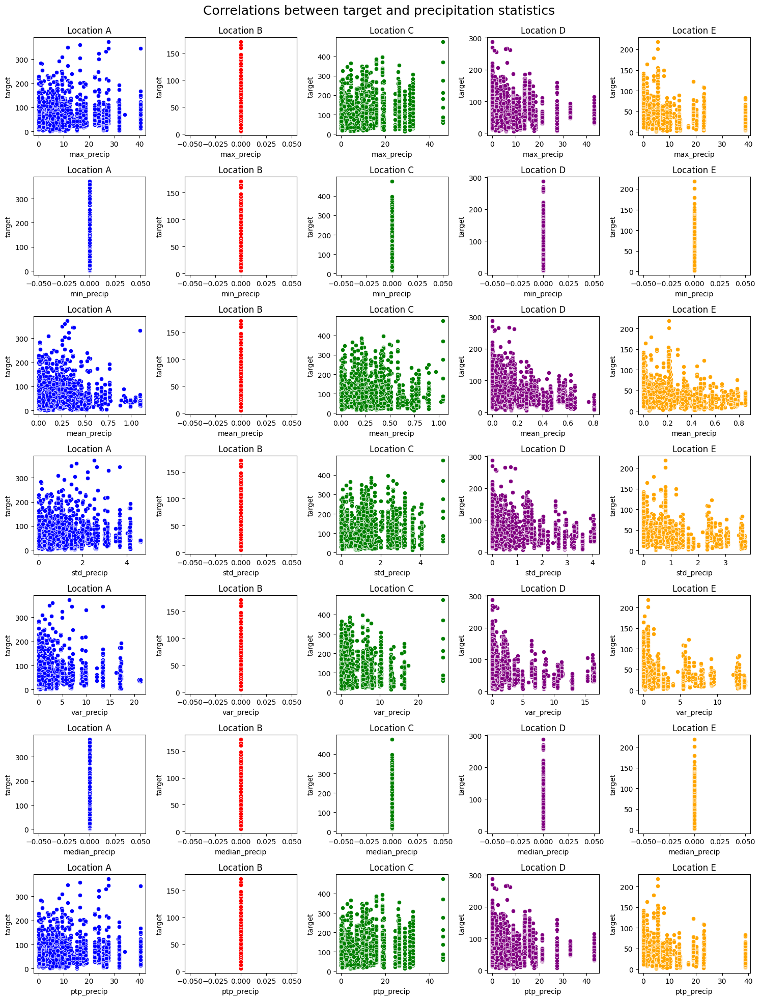

In [37]:
plot_scatter(df_filtered, df_filtered.columns[23:30].tolist(), 'Correlations between target and precipitation statistics')

In [39]:
df_filtered.columns[30:37]

Index(['max_rel_humidity', 'min_rel_humidity', 'mean_rel_humidity',
       'std_rel_humidity', 'var_rel_humidity', 'median_rel_humidity',
       'ptp_rel_humidity'],
      dtype='object')

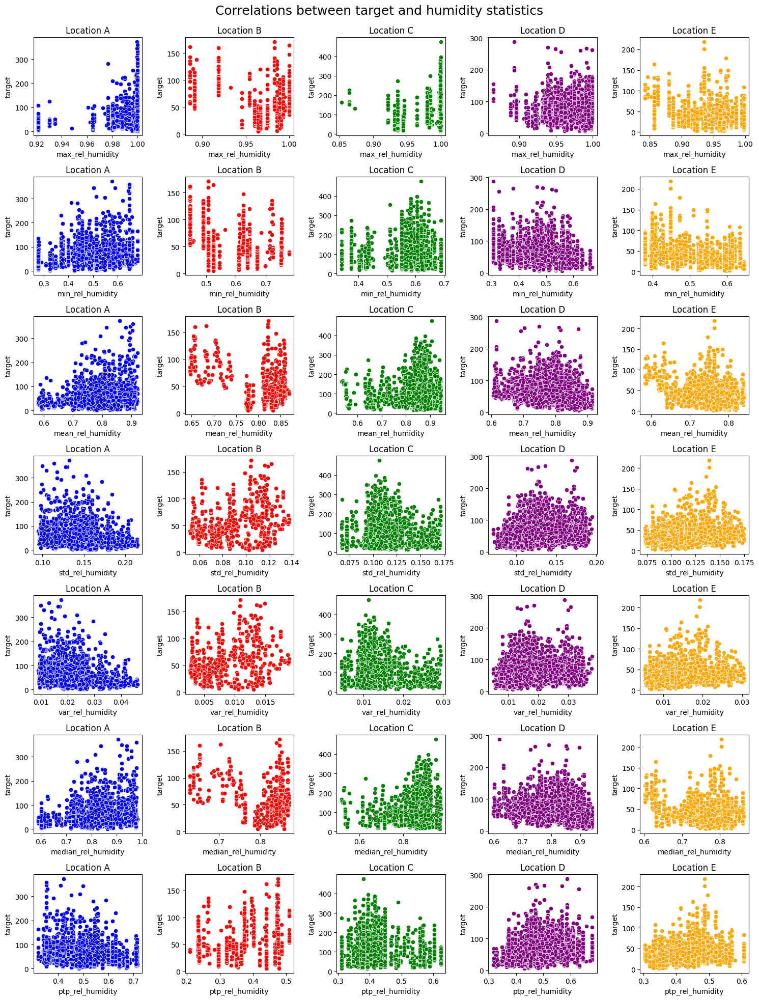

In [40]:
plot_scatter(df_filtered, df_filtered.columns[30:37].tolist(), 'Correlations between target and humidity statistics')

In [41]:
df_filtered.columns[37:44]

Index(['max_wind_dir_x', 'min_wind_dir_x', 'mean_wind_dir_x', 'std_wind_dir_x',
       'var_wind_dir_x', 'median_wind_dir_x', 'ptp_wind_dir_x'],
      dtype='object')

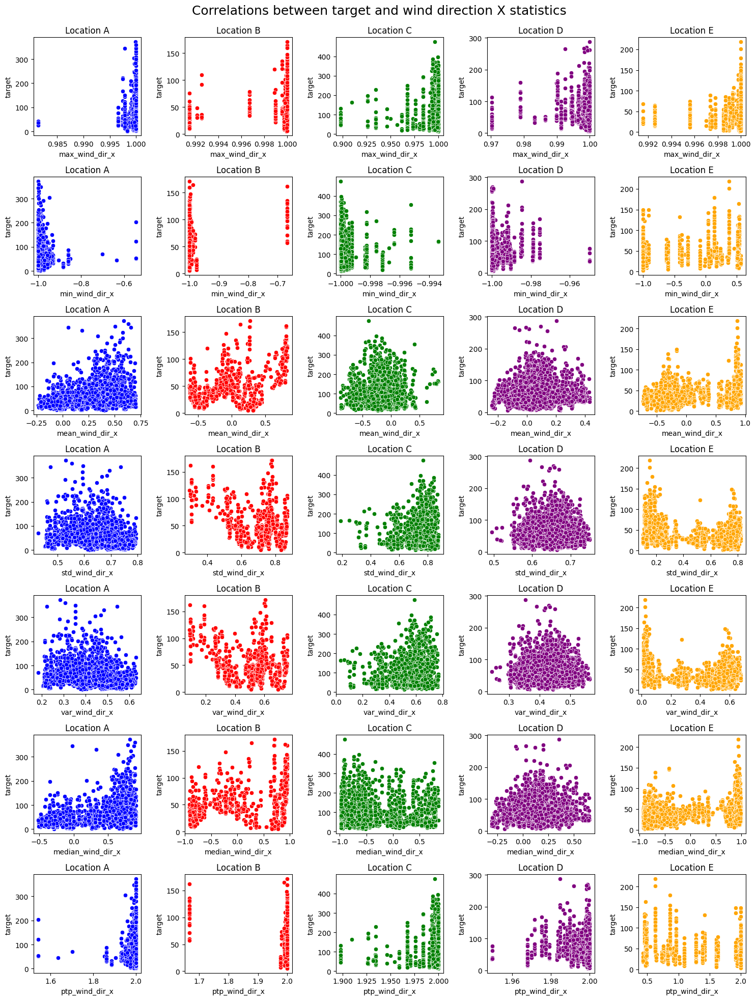

In [42]:
plot_scatter(df_filtered, df_filtered.columns[37:44].tolist(), 'Correlations between target and wind direction X statistics')

In [43]:
df_filtered.columns[44:51]

Index(['max_wind_dir_y', 'min_wind_dir_y', 'mean_wind_dir_y', 'std_wind_dir_y',
       'var_wind_dir_y', 'median_wind_dir_y', 'ptp_wind_dir_y'],
      dtype='object')

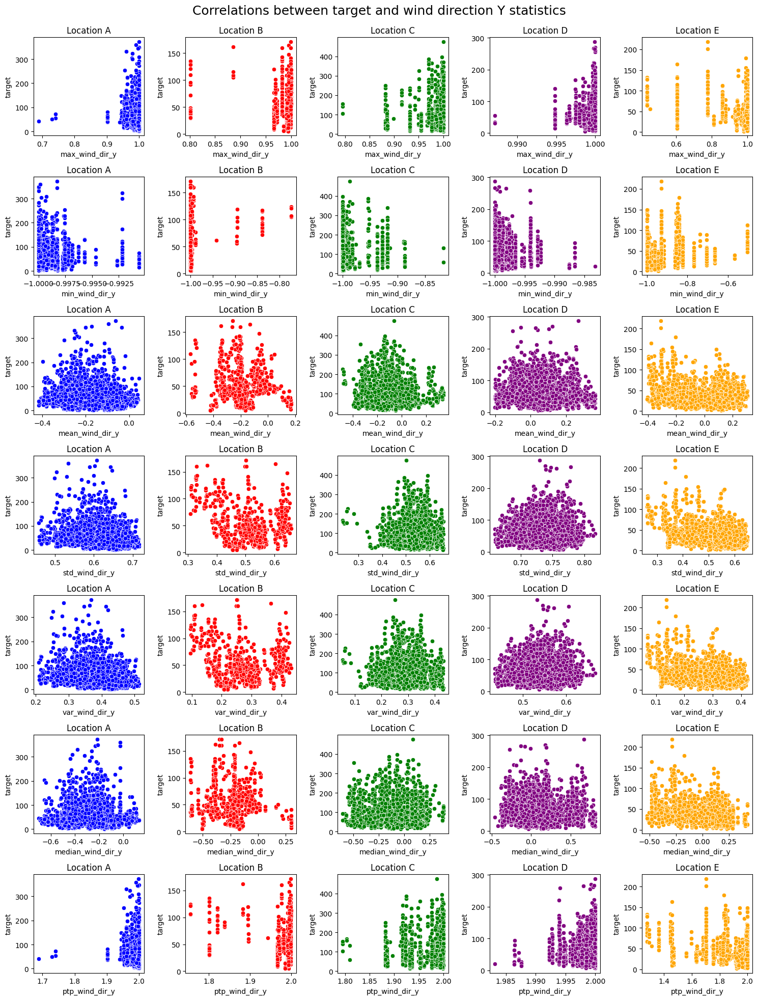

In [44]:
plot_scatter(df_filtered, df_filtered.columns[44:51].tolist(), 'Correlations between target and wind direction Y statistics')

In [45]:
df_filtered.columns[51:58]

Index(['max_wind_spd', 'min_wind_spd', 'mean_wind_spd', 'std_wind_spd',
       'var_wind_spd', 'median_wind_spd', 'ptp_wind_spd'],
      dtype='object')

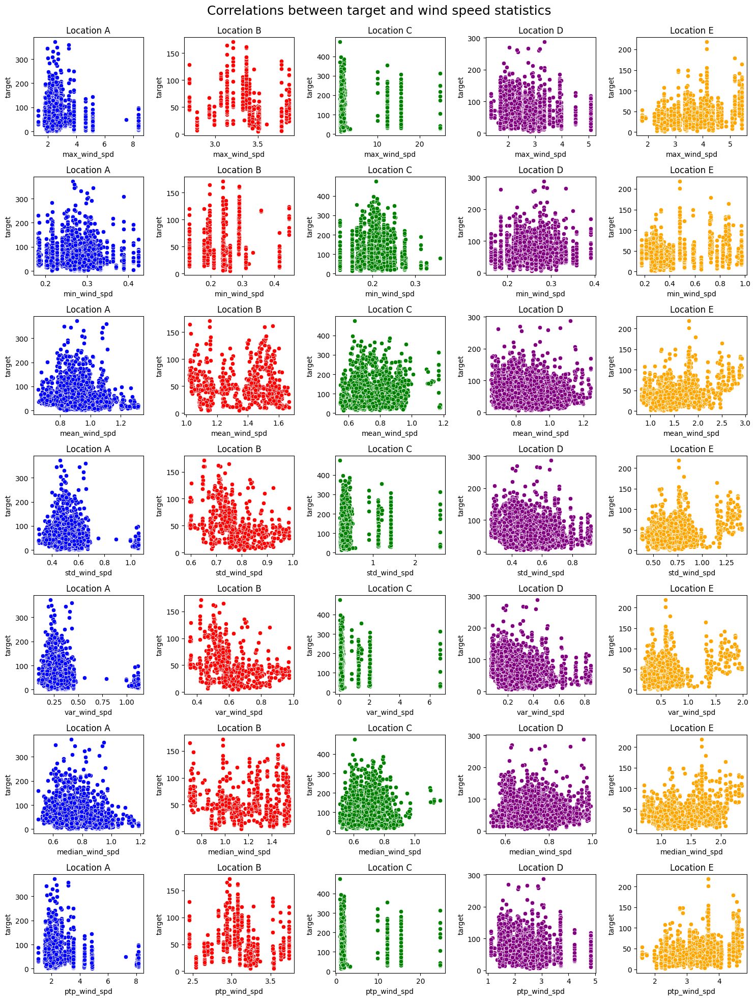

In [46]:
plot_scatter(df_filtered, df_filtered.columns[51:58].tolist(), 'Correlations between target and wind speed statistics')

In [47]:
df_filtered.columns[58:65]

Index(['max_atmos_press', 'min_atmos_press', 'mean_atmos_press',
       'std_atmos_press', 'var_atmos_press', 'median_atmos_press',
       'ptp_atmos_press'],
      dtype='object')

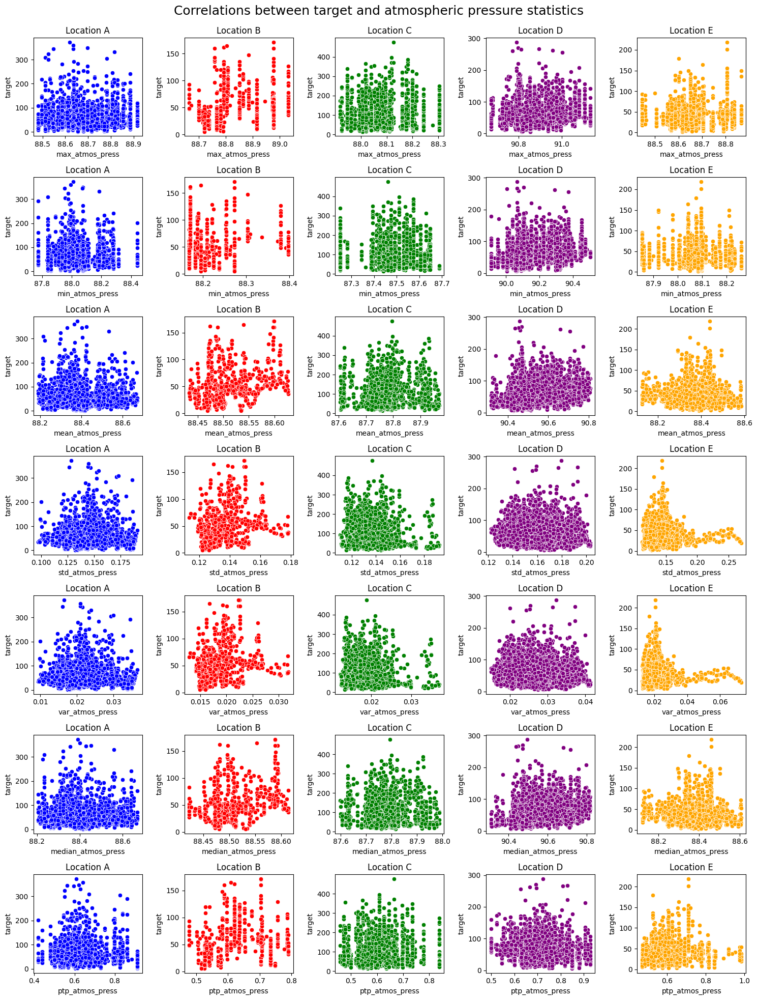

In [48]:
plot_scatter(df_filtered, df_filtered.columns[58:65].tolist(), 'Correlations between target and atmospheric pressure statistics')

#### log-transform target variable since it is strongly skewed

In [49]:
df_filtered['log_target'] = np.log10(df_filtered.target)

/var/folders/dn/n_6mm8pj72738s4ygylk0sgm0000gn/T/ipykernel_6666/216964214.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['log_target'] = np.log10(df_filtered.target)


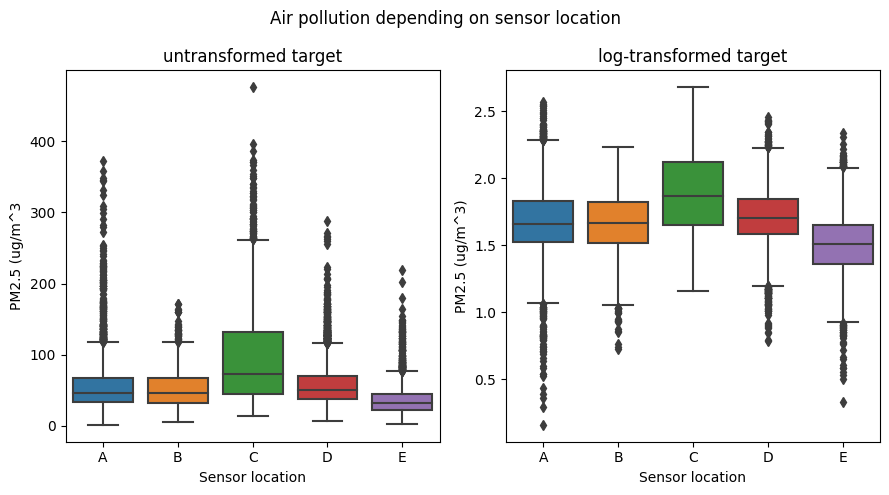

In [50]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 5))
plt.suptitle('Air pollution depending on sensor location')

plot1 = sns.boxplot(data=df_filtered, x='location', y='target', ax=ax1, order=['A', 'B', 'C', 'D', 'E'])
ax1.set_title('untransformed target')
ax1.set_ylabel('PM2.5 (ug/m^3')
ax1.set_xlabel('Sensor location')

plot2 = sns.boxplot(data=df_filtered, x='location', y='log_target', ax=ax2, order=['A', 'B', 'C', 'D', 'E'])
ax2.set_title('log-transformed target')
ax2.set_ylabel('PM2.5 (ug/m^3)')
ax2.set_xlabel('Sensor location')

plt.tight_layout();

### Calculate improved Ridge regression model with a set of different summary features

In [56]:
# import libraries and metrics
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error

In [51]:
df_filtered.columns

Index(['location', 'target', 'percent_nan_temp', 'percent_nan_precip',
       'percent_nan_rel_humidity', 'percent_nan_wind_dir_x',
       'percent_nan_wind_dir_y', 'percent_nan_wind_spd',
       'percent_nan_atmos_press', 'last_temp', 'last_precip',
       'last_rel_humidity', 'last_wind_dir_x', 'last_wind_dir_y',
       'last_wind_spd', 'last_atmos_press', 'max_temp', 'min_temp',
       'mean_temp', 'std_temp', 'var_temp', 'median_temp', 'ptp_temp',
       'max_precip', 'min_precip', 'mean_precip', 'std_precip', 'var_precip',
       'median_precip', 'ptp_precip', 'max_rel_humidity', 'min_rel_humidity',
       'mean_rel_humidity', 'std_rel_humidity', 'var_rel_humidity',
       'median_rel_humidity', 'ptp_rel_humidity', 'max_wind_dir_x',
       'min_wind_dir_x', 'mean_wind_dir_x', 'std_wind_dir_x', 'var_wind_dir_x',
       'median_wind_dir_x', 'ptp_wind_dir_x', 'max_wind_dir_y',
       'min_wind_dir_y', 'mean_wind_dir_y', 'std_wind_dir_y', 'var_wind_dir_y',
       'median_wind_dir_y', 

#### Include mean, standard deviation, and last measurement from weather recordings as features

In [52]:
# get target and features
X = df_filtered[['location', 'mean_temp', 'mean_precip', 'mean_rel_humidity', 'mean_wind_dir_x', 'mean_wind_dir_y', 'mean_wind_spd', 'mean_atmos_press',
                'std_temp', 'std_precip', 'std_rel_humidity', 'std_wind_dir_x', 'std_wind_dir_y','std_wind_spd', 'std_atmos_press',
                'last_temp', 'last_precip','last_rel_humidity', 'last_wind_dir_x', 'last_wind_dir_y','last_wind_spd', 'last_atmos_press']]
y = df_filtered['target']

print(X.shape)
print(y.shape)

(13452, 22)
(13452,)


In [53]:
#dummy-encode the location feature
location = pd.get_dummies(X['location'], prefix='location',drop_first=True)
location.head()

,location_B,location_C,location_D,location_E
ID,,,,
ID_train_1,0,0,1,0
ID_train_10000,0,0,0,1
ID_train_10001,0,1,0,0
ID_train_10002,0,0,0,0
ID_train_10005,0,0,1,0


In [54]:
# concatenate dummy-encoded locations feature to original dataframe
X = pd.concat([X, location],axis = 1)
X.head()

,location,mean_temp,mean_precip,mean_rel_humidity,mean_wind_dir_x,mean_wind_dir_y,mean_wind_spd,mean_atmos_press,std_temp,std_precip,...,last_precip,last_rel_humidity,last_wind_dir_x,last_wind_dir_y,last_wind_spd,last_atmos_press,location_B,location_C,location_D,location_E
ID,,,,,,,,,,,,,,,,,,,,,
ID_train_1,D,24.679063,0.007025,0.758058,-0.061331,0.146340,0.899208,90.429924,4.266955,0.051706,...,0.561,0.797333,0.453481,-0.891266,1.019167,90.529167,0,0,1,0
ID_train_10000,E,22.581950,0.572736,0.795031,-0.384539,0.175220,1.133221,88.437645,2.822580,2.658583,...,0.000,0.773000,-0.819840,0.572592,1.301667,88.510000,0,0,0,1
ID_train_10001,C,23.638430,0.057628,0.725441,-0.411855,0.015926,0.957961,87.717645,2.785974,0.279656,...,0.868,0.995833,-0.890824,-0.454349,0.633333,87.663333,0,1,0,0
ID_train_10002,A,22.624518,0.634215,0.807800,0.291545,-0.265957,0.908583,88.212652,3.535216,4.116347,...,0.000,0.998500,0.796598,-0.604510,1.399167,88.175833,0,0,0,0
ID_train_10005,D,23.189507,0.094843,0.789361,0.276968,0.157581,1.101989,90.624814,4.432786,0.936545,...,0.000,0.759167,-0.684210,0.729285,0.618333,90.531667,0,0,1,0


In [57]:
# perform train test split, stratified by location in order to ensure that locations are balanced between training and test set
rseed = 42

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=X['location'], random_state=rseed)

print(X_train.shape)
print(X_test.shape)

(9416, 26)
(4036, 26)


In [58]:
X_train.columns

Index(['location', 'mean_temp', 'mean_precip', 'mean_rel_humidity',
       'mean_wind_dir_x', 'mean_wind_dir_y', 'mean_wind_spd',
       'mean_atmos_press', 'std_temp', 'std_precip', 'std_rel_humidity',
       'std_wind_dir_x', 'std_wind_dir_y', 'std_wind_spd', 'std_atmos_press',
       'last_temp', 'last_precip', 'last_rel_humidity', 'last_wind_dir_x',
       'last_wind_dir_y', 'last_wind_spd', 'last_atmos_press', 'location_B',
       'location_C', 'location_D', 'location_E'],
      dtype='object')

In [59]:
# scale features using z-transformation
scaler = StandardScaler()

# fit_transform training data, drop location column since it will not be used for prediction
X_train_scaled = scaler.fit_transform(X_train[['mean_temp', 'mean_precip', 'mean_rel_humidity',
       'mean_wind_dir_x', 'mean_wind_dir_y', 'mean_wind_spd',
       'mean_atmos_press', 'std_temp', 'std_precip', 'std_rel_humidity',
       'std_wind_dir_x', 'std_wind_dir_y', 'std_wind_spd', 'std_atmos_press',
       'last_temp', 'last_precip', 'last_rel_humidity', 'last_wind_dir_x',
       'last_wind_dir_y', 'last_wind_spd', 'last_atmos_press']])
# aply transform to test data
X_test_scaled = scaler.transform(X_test[['mean_temp', 'mean_precip', 'mean_rel_humidity',
       'mean_wind_dir_x', 'mean_wind_dir_y', 'mean_wind_spd',
       'mean_atmos_press', 'std_temp', 'std_precip', 'std_rel_humidity',
       'std_wind_dir_x', 'std_wind_dir_y', 'std_wind_spd', 'std_atmos_press',
       'last_temp', 'last_precip', 'last_rel_humidity', 'last_wind_dir_x',
       'last_wind_dir_y', 'last_wind_spd', 'last_atmos_press']])

In [60]:
print(X_train_scaled.shape)
print(X_test_scaled.shape)

(9416, 21)
(4036, 21)


In [61]:
# combine scaled metric features and dummy-encoded location features
X_train_preprocessed = np.concatenate([X_train_scaled, X_train[['location_B', 'location_C', 'location_D', 'location_E']]], axis=1)
X_test_preprocessed = np.concatenate([X_test_scaled, X_test[['location_B', 'location_C', 'location_D', 'location_E']]], axis=1)

print(X_train_preprocessed.shape)
print(X_test_preprocessed.shape)

(9416, 25)
(4036, 25)


#### First calculate linear regression model

In [64]:
# train the model
linreg = LinearRegression()

linreg.fit(X_train_preprocessed, y_train)

LinearRegression()

In [65]:
# get beta coefficients
linreg.coef_

array([  1.69102511,  -7.68343606,  -0.81647098,   5.59415974,
        -1.05956124,  -7.09236906,  17.35582568,   8.65703754,
         6.53133462,  -7.10230747,  -1.85910287,  -5.62908452,
         1.91532238,   1.67674374,  -6.6906972 ,  -1.08601171,
        -4.7710013 ,  -1.10602866,   0.69224079,  -5.517463  ,
        14.87547209,   1.77508507,  66.34920134, -60.66779233,
        -9.09666976])

In [66]:
# predict new cases
y_pred = linreg.predict(X_test_preprocessed)

# evaluate model accurray

rmse_linreg = mean_squared_error(y_test, y_pred, squared=False)
r2_linreg = r2_score(y_test, y_pred)

print(f'RMSE on testset: {round(rmse_linreg,2)}')
print(f'Coefficient of determination on testset: {round(r2_linreg,2)}')

RMSE on testset: 37.83
Coefficient of determination on testset: 0.22


### Residual plot

In [67]:
# calculate residuals
residual = y_test - y_pred

# compute mean of residuals
np.mean(residual)

0.5017691986198536

Thus, on average, our baseline model rather seems to underestimate the air pollution, as indicated by an average residual error > 0.

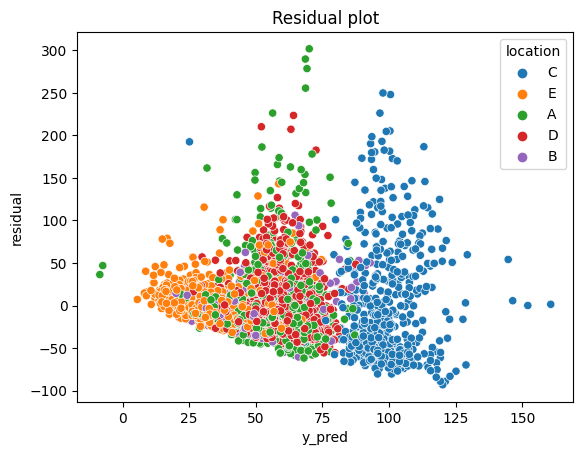

In [68]:
sns.scatterplot(x=y_pred, y=residual, hue=X_test['location'])
plt.xlabel('y_pred')
plt.ylabel('residual')
plt.title('Residual plot');

#### Calculate Ridge regression model

##### Find best hyperparameters using GridSearch

In [69]:
ridge = Ridge()
ridge.get_params().keys()

dict_keys(['alpha', 'copy_X', 'fit_intercept', 'max_iter', 'normalize', 'positive', 'random_state', 'solver', 'tol'])

In [70]:
# define parameter grid
param_grid = {'alpha': [0.1, 1, 10],
                'solver': ['sparse_cg', 'lsqr', 'saga']}

# instantiate gridsearch and define the metric to optimize 
gs = GridSearchCV(Ridge(random_state=42), param_grid, scoring='neg_root_mean_squared_error',
                  cv=5, verbose=5, n_jobs=-1)

gs.fit(X_train_preprocessed, y_train)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV 2/5] END .....alpha=0.1, solver=sparse_cg;, score=-39.022 total time=   0.0s
[CV 1/5] END ..........alpha=0.1, solver=lsqr;, score=-38.343 total time=   0.0s
[CV 2/5] END ..........alpha=0.1, solver=lsqr;, score=-39.060 total time=   0.0s
[CV 1/5] END .....alpha=0.1, solver=sparse_cg;, score=-38.316 total time=   0.0s
[CV 4/5] END ..........alpha=0.1, solver=lsqr;, score=-37.087 total time=   0.0s
[CV 5/5] END .....alpha=0.1, solver=sparse_cg;, score=-36.647 total time=   0.0s
[CV 3/5] END ..........alpha=0.1, solver=lsqr;, score=-37.876 total time=   0.0s
[CV 5/5] END ..........alpha=0.1, solver=lsqr;, score=-36.629 total time=   0.0s
[CV 4/5] END .....alpha=0.1, solver=sparse_cg;, score=-37.012 total time=   0.0s
[CV 3/5] END .....alpha=0.1, solver=sparse_cg;, score=-37.807 total time=   0.0s
[CV 1/5] END .......alpha=1, solver=sparse_cg;, score=-38.316 total time=   0.0s
[CV 2/5] END .......alpha=1, solver=sparse_cg;, s

GridSearchCV(cv=5, estimator=Ridge(random_state=42), n_jobs=-1,
             param_grid={'alpha': [0.1, 1, 10],
                         'solver': ['sparse_cg', 'lsqr', 'saga']},
             scoring='neg_root_mean_squared_error', verbose=5)

In [71]:
# Best score
print('Best score:', round(gs.best_score_, 3))

# Best parameters
print('Best parameters:', gs.best_params_)

Best score: -37.761
Best parameters: {'alpha': 0.1, 'solver': 'sparse_cg'}


#### Retrain best model on whole training set

In [72]:
# save best model
ridge_best = gs.best_estimator_
ridge_best

Ridge(alpha=0.1, random_state=42, solver='sparse_cg')

In [73]:
ridge_best.fit(X_train_preprocessed, y_train)

Ridge(alpha=0.1, random_state=42, solver='sparse_cg')

In [74]:
y_pred_ridge = ridge_best.predict(X_test_preprocessed)

In [75]:
# evaluate model accurray
rmse_ridge = mean_squared_error(y_test, y_pred_ridge, squared=False)
r2_ridge = r2_score(y_test, y_pred_ridge)

print(f'RMSE on testset: {round(rmse_ridge,2)}')
print(f'Coefficient of determination on testset: {round(r2_ridge,2)}')

RMSE on testset: 37.83
Coefficient of determination on testset: 0.22


In [76]:
# calculate residuals
residual_ridge = y_test - y_pred_ridge

# compute mean of residuals
np.mean(residual_ridge)

0.5013289986269642

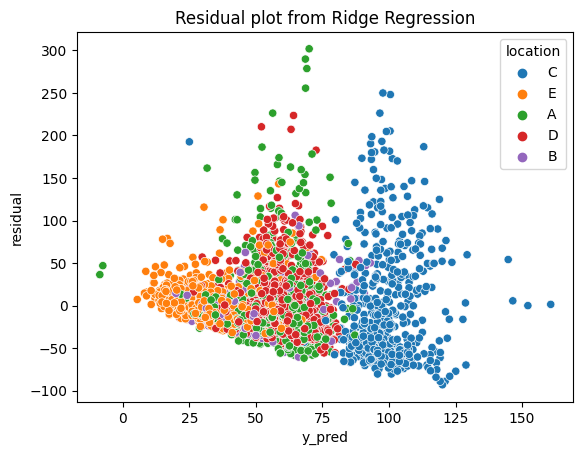

In [77]:
sns.scatterplot(x=y_pred_ridge, y=residual_ridge, hue=X_test['location'])
plt.xlabel('y_pred')
plt.ylabel('residual')
plt.title('Residual plot from Ridge Regression');

### Calculate Decision Tree Regressor

In [78]:
# import the regressor 
from sklearn.tree import DecisionTreeRegressor  
  
# create a regressor object 
dec_tree = DecisionTreeRegressor()  
  
# get hyperparameters
dec_tree.get_params()

{'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': None,
 'splitter': 'best'}

In [79]:
tree_params = {'max_depth': [10, 20, 30, 40, 50],
                'min_samples_leaf': [5, 10, 15, 20],
                'max_leaf_nodes': [100, 200, 500, 1000]}

grid_tree = GridSearchCV(DecisionTreeRegressor(), tree_params, scoring='neg_root_mean_squared_error',
                  cv=5, verbose=5, n_jobs=-1)

grid_tree.fit(X_train_preprocessed, y_train)

Fitting 5 folds for each of 80 candidates, totalling 400 fits
[CV 2/5] END max_depth=10, max_leaf_nodes=100, min_samples_leaf=5;, score=-37.221 total time=   0.1s
[CV 1/5] END max_depth=10, max_leaf_nodes=100, min_samples_leaf=5;, score=-37.054 total time=   0.1s
[CV 3/5] END max_depth=10, max_leaf_nodes=100, min_samples_leaf=5;, score=-37.490 total time=   0.1s
[CV 5/5] END max_depth=10, max_leaf_nodes=100, min_samples_leaf=5;, score=-35.834 total time=   0.1s
[CV 4/5] END max_depth=10, max_leaf_nodes=100, min_samples_leaf=5;, score=-35.482 total time=   0.1s
[CV 2/5] END max_depth=10, max_leaf_nodes=100, min_samples_leaf=10;, score=-35.716 total time=   0.1s
[CV 1/5] END max_depth=10, max_leaf_nodes=100, min_samples_leaf=10;, score=-37.129 total time=   0.1s
[CV 3/5] END max_depth=10, max_leaf_nodes=100, min_samples_leaf=10;, score=-36.823 total time=   0.1s
[CV 4/5] END max_depth=10, max_leaf_nodes=100, min_samples_leaf=10;, score=-34.754 total time=   0.1s
[CV 5/5] END max_depth=10

GridSearchCV(cv=5, estimator=DecisionTreeRegressor(), n_jobs=-1,
             param_grid={'max_depth': [10, 20, 30, 40, 50],
                         'max_leaf_nodes': [100, 200, 500, 1000],
                         'min_samples_leaf': [5, 10, 15, 20]},
             scoring='neg_root_mean_squared_error', verbose=5)

In [80]:
# Best score
print('Best score:', round(grid_tree.best_score_, 3))

# Best parameters
print('Best parameters:', grid_tree.best_params_)

Best score: -34.964
Best parameters: {'max_depth': 20, 'max_leaf_nodes': 500, 'min_samples_leaf': 20}


#### retrain on whole training set

In [81]:
# save best model
dectree_best = grid_tree.best_estimator_
dectree_best

DecisionTreeRegressor(max_depth=20, max_leaf_nodes=500, min_samples_leaf=20)

In [82]:
dectree_best.fit(X_train_preprocessed, y_train)

DecisionTreeRegressor(max_depth=20, max_leaf_nodes=500, min_samples_leaf=20)

In [84]:
y_pred_dectree = dectree_best.predict(X_test_preprocessed)

In [85]:
# evaluate model accurray
rmse_dectree = mean_squared_error(y_test, y_pred_dectree, squared=False)
r2_dectree = r2_score(y_test, y_pred_dectree)

print(f'RMSE on testset: {round(rmse_dectree,2)}')
print(f'Coefficient of determination on testset: {round(r2_dectree,2)}')

RMSE on testset: 34.02
Coefficient of determination on testset: 0.37


In [86]:
# calculate residuals
residual_dectree = y_test - y_pred_dectree

# compute mean of residuals
np.mean(residual_dectree)

0.9218082525805306

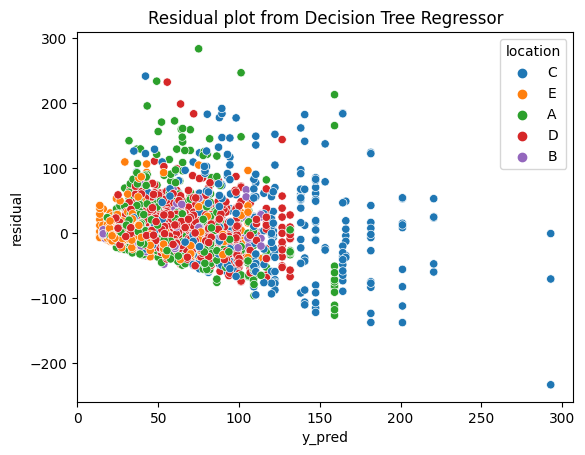

In [87]:
sns.scatterplot(x=y_pred_dectree, y=residual_dectree, hue=X_test['location'])
plt.xlabel('y_pred')
plt.ylabel('residual')
plt.title('Residual plot from Decision Tree Regressor');

### Calculate Random Forest Regressor

In [88]:
from sklearn.ensemble import RandomForestRegressor

In [89]:
# create a rf object 
rf = RandomForestRegressor()
  
# get hyperparameters
rf.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [90]:
rf_params = {'max_depth': [10, 20, 30, 40, 50],
                'min_samples_leaf': [5, 10, 15, 20],
                'max_leaf_nodes': [100, 200, 500, 1000]}

grid_rf = GridSearchCV(RandomForestRegressor(), tree_params, scoring='neg_root_mean_squared_error',
                  cv=5, verbose=5, n_jobs=-1)

grid_rf.fit(X_train_preprocessed, y_train)

Fitting 5 folds for each of 80 candidates, totalling 400 fits
[CV 5/5] END max_depth=10, max_leaf_nodes=100, min_samples_leaf=5;, score=-32.128 total time=   6.5s
[CV 4/5] END max_depth=10, max_leaf_nodes=100, min_samples_leaf=5;, score=-31.538 total time=   6.6s
[CV 2/5] END max_depth=10, max_leaf_nodes=100, min_samples_leaf=10;, score=-32.947 total time=   6.6s
[CV 1/5] END max_depth=10, max_leaf_nodes=100, min_samples_leaf=5;, score=-32.666 total time=   6.7s
[CV 1/5] END max_depth=10, max_leaf_nodes=100, min_samples_leaf=10;, score=-32.958 total time=   6.7s
[CV 3/5] END max_depth=10, max_leaf_nodes=100, min_samples_leaf=5;, score=-32.288 total time=   6.9s
[CV 2/5] END max_depth=10, max_leaf_nodes=100, min_samples_leaf=5;, score=-32.806 total time=   7.0s
[CV 3/5] END max_depth=10, max_leaf_nodes=100, min_samples_leaf=10;, score=-32.278 total time=   7.0s
[CV 4/5] END max_depth=10, max_leaf_nodes=100, min_samples_leaf=10;, score=-31.496 total time=   6.6s
[CV 1/5] END max_depth=10

GridSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'max_depth': [10, 20, 30, 40, 50],
                         'max_leaf_nodes': [100, 200, 500, 1000],
                         'min_samples_leaf': [5, 10, 15, 20]},
             scoring='neg_root_mean_squared_error', verbose=5)

In [91]:
# Best score
print('Best score:', round(grid_rf.best_score_, 3))

# Best parameters
print('Best parameters:', grid_rf.best_params_)

Best score: -30.066
Best parameters: {'max_depth': 50, 'max_leaf_nodes': 1000, 'min_samples_leaf': 5}


#### retrain on whole training set

In [92]:
# save best model
rf_best = grid_rf.best_estimator_
rf_best

RandomForestRegressor(max_depth=50, max_leaf_nodes=1000, min_samples_leaf=5)

In [93]:
rf_best.fit(X_train_preprocessed, y_train)

RandomForestRegressor(max_depth=50, max_leaf_nodes=1000, min_samples_leaf=5)

In [94]:
y_pred_rf = rf_best.predict(X_test_preprocessed)

In [95]:
# evaluate model accurray
rmse_rf = mean_squared_error(y_test, y_pred_rf, squared=False)
r2_rf = r2_score(y_test, y_pred_rf)

print(f'RMSE on testset: {round(rmse_rf,2)}')
print(f'Coefficient of determination on testset: {round(r2_rf,2)}')

RMSE on testset: 29.18
Coefficient of determination on testset: 0.53


In [96]:
# calculate residuals
residual_rf = y_test - y_pred_rf

# compute mean of residuals
np.mean(residual_rf)

0.3204867047611807

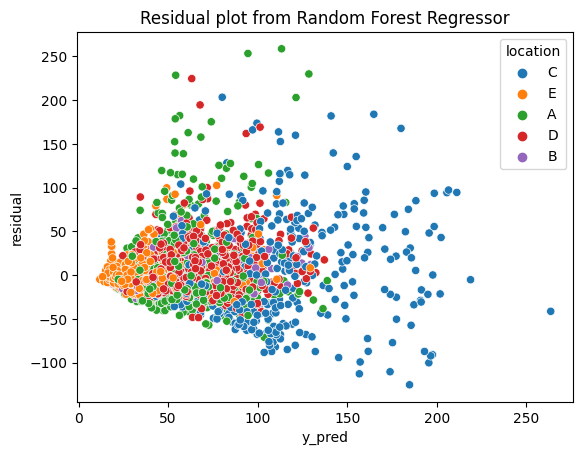

In [97]:
sns.scatterplot(x=y_pred_rf, y=residual_rf, hue=X_test['location'])
plt.xlabel('y_pred')
plt.ylabel('residual')
plt.title('Residual plot from Random Forest Regressor');

### Calculate XGBoost Model

In [98]:
from xgboost import XGBRegressor

In [99]:
xgb = XGBRegressor()
xgb.get_params

<bound method XGBModel.get_params of XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, gamma=None,
             gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, predictor=None, random_state=None,
             reg_alpha=None, reg_lambda=None, ...)>

In [103]:
xgb_params = {'n_estimators': [50, 100, 150, 200],
                'max_depth': [10, 20, 30, 40, 50],
                'max_leaves': [100, 200, 500, 1000]}

grid_xgb = GridSearchCV(XGBRegressor(seed=42), xgb_params, scoring='neg_root_mean_squared_error',
                  cv=5, verbose=5, n_jobs=-1)

grid_xgb.fit(X_train_preprocessed, y_train)

Fitting 5 folds for each of 80 candidates, totalling 400 fits
[CV 3/5] END max_depth=10, max_leaves=100, n_estimators=50;, score=-30.046 total time=   2.5s
[CV 4/5] END max_depth=10, max_leaves=100, n_estimators=50;, score=-29.645 total time=   2.6s
[CV 1/5] END max_depth=10, max_leaves=100, n_estimators=50;, score=-30.235 total time=   2.6s
[CV 5/5] END max_depth=10, max_leaves=100, n_estimators=50;, score=-30.212 total time=   2.7s
[CV 2/5] END max_depth=10, max_leaves=100, n_estimators=50;, score=-30.906 total time=   2.7s
[CV 3/5] END max_depth=10, max_leaves=100, n_estimators=100;, score=-29.825 total time=   5.4s
[CV 2/5] END max_depth=10, max_leaves=100, n_estimators=100;, score=-30.815 total time=   5.6s
[CV 1/5] END max_depth=10, max_leaves=100, n_estimators=100;, score=-30.185 total time=   5.7s
[CV 4/5] END max_depth=10, max_leaves=100, n_estimators=100;, score=-29.542 total time=   5.7s
[CV 5/5] END max_depth=10, max_leaves=100, n_estimators=100;, score=-30.018 total time= 

GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    gamma=None, gpu_id=None, grow_policy=None,
                                    importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, max_bin=None,
                                    max_cat...
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None, n_estimators=100,
                                  

In [104]:
# Best score
print('Best score:', round(grid_xgb.best_score_, 3))

# Best parameters
print('Best parameters:', grid_xgb.best_params_)

Best score: -30.011
Best parameters: {'max_depth': 10, 'max_leaves': 100, 'n_estimators': 200}


#### retrain on whole training set

In [105]:
# save best model
xgb_best = grid_xgb.best_estimator_
xgb_best

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=10, max_leaves=100, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=200, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=42,
             reg_alpha=0, reg_lambda=1, ...)

In [106]:
xgb_best.fit(X_train_preprocessed, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=10, max_leaves=100, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=200, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=42,
             reg_alpha=0, reg_lambda=1, ...)

In [107]:
y_pred_xgb = xgb_best.predict(X_test_preprocessed)

In [108]:
# evaluate model accurray
rmse_xgb = mean_squared_error(y_test, y_pred_xgb, squared=False)
r2_xgb = r2_score(y_test, y_pred_xgb)

print(f'RMSE on testset: {round(rmse_xgb,2)}')
print(f'Coefficient of determination on testset: {round(r2_xgb,2)}')

RMSE on testset: 28.73
Coefficient of determination on testset: 0.55


In [109]:
# calculate residuals
residual_xgb = y_test - y_pred_xgb

# compute mean of residuals
np.mean(residual_xgb)

0.5061204636629039

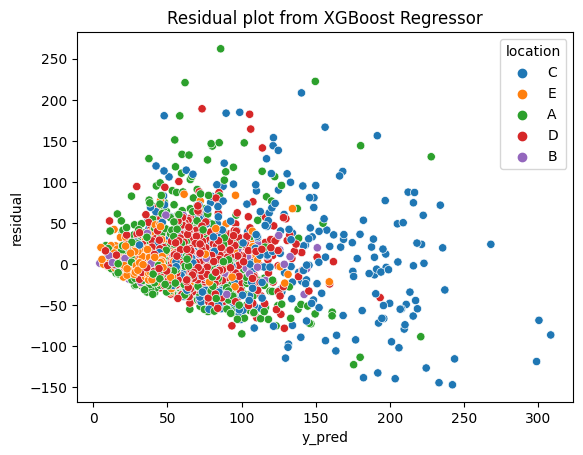

In [110]:
sns.scatterplot(x=y_pred_xgb, y=residual_xgb, hue=X_test['location'])
plt.xlabel('y_pred')
plt.ylabel('residual')
plt.title('Residual plot from XGBoost Regressor');

### Convert actual and predicted PM2.5 levels from best models into air quality categories

In [120]:
# plotting function for color-coded confusion matrix
import itertools
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Oranges):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    Source: http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    #print(cm)

    plt.figure(figsize = (10, 10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, size = 24)
    plt.colorbar(aspect=4)
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45, size = 14)
    plt.yticks(tick_marks, classes, size = 14)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    
    # Labeling the plot
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), fontsize = 20,
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
        
    plt.grid(None)
    plt.tight_layout()
    plt.ylabel('True label', size = 18)
    plt.xlabel('Predicted label', size = 18)

In [113]:
# actual y labels
y_test_labels = ['good' if x < 13 else 'moderate' if x < 36 else 'unhealthy_sensitive' if x < 56 else 'unhealthy' if x < 151 
                    else 'very_unhealthy' if x < 251 else 'hazardous' for x in y_test]

# predicted y labels by RandomForest Regressor
y_pred_labels_rf = ['good' if x < 13 else 'moderate' if x < 36 else 'unhealthy_sensitive' if x < 56 else 'unhealthy' if x < 151 
                    else 'very_unhealthy' if x < 251 else 'hazardous' for x in y_pred_rf]

# predicted y labels by XGBoost Regressor
y_pred_labels_xgb = ['good' if x < 13 else 'moderate' if x < 36 else 'unhealthy_sensitive' if x < 56 else 'unhealthy' if x < 151 
                    else 'very_unhealthy' if x < 251 else 'hazardous' for x in y_pred_xgb]

### Compute confusion matrix and plot

In [114]:
cm_rf = confusion_matrix(y_test_labels, y_pred_labels_rf)

Confusion matrix, without normalization


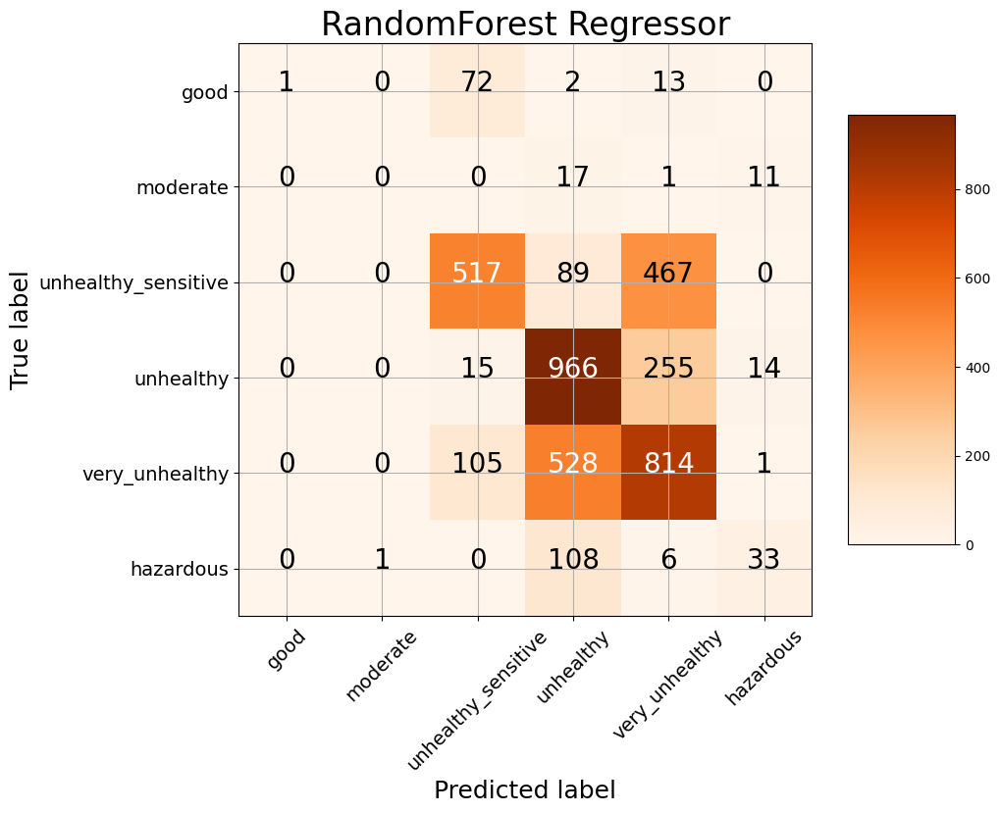

In [124]:
plot_confusion_matrix(cm_rf, classes=['good', 'moderate', 'unhealthy_sensitive', 'unhealthy', 'very_unhealthy', 'hazardous'],
                title='RandomForest Regressor');

In [118]:
cm_xgb = confusion_matrix(y_test_labels, y_pred_labels_xgb)

Confusion matrix, without normalization


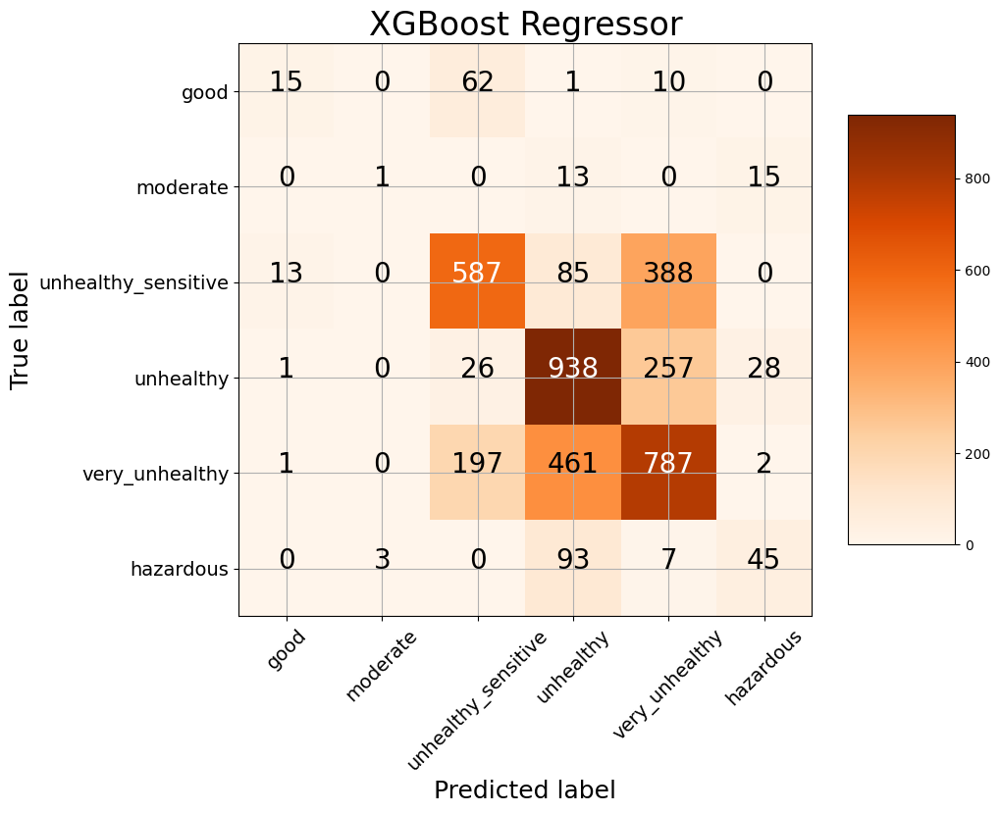

In [125]:
plot_confusion_matrix(cm_xgb, classes=['good', 'moderate', 'unhealthy_sensitive', 'unhealthy', 'very_unhealthy', 'hazardous'],
                title='XGBoost Regressor');